<a href="https://colab.research.google.com/github/dwij2212/SOP-Notebooks/blob/master/foggy_model_train_reside.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Imports

In [ ]:
import tensorflow as tf
import numpy as np
import os
import time
import tensorflow.keras.backend as K

from matplotlib import pyplot as plt
from IPython import display

import sys
import cv2
import scipy
import scipy.ndimage
import matplotlib.pyplot as plt


In [ ]:
BUFFER_SIZE = 400
BATCH_SIZE = 16
IMG_WIDTH = 256
IMG_HEIGHT = 256
PATH = "/content/drive/MyDrive/2-2/SOP/reside/SOTS/outdoor/"

AUTO = tf.data.experimental.AUTOTUNE
OUTPUT_CHANNELS = 3
LEARNING_RATE_INITIAL = 2e-4

# Preprocessing functions

In [ ]:
def load(image_file):

    real_image = tf.io.read_file(PATH + 'gt/' + image_file[0])
    real_image = tf.image.decode_jpeg(real_image)

    input_image = tf.io.read_file(PATH + 'hazy/' +image_file[1])
    input_image = tf.image.decode_jpeg(input_image)

    refineDR = tf.io.read_file(PATH + 'dmap/' +image_file[0])
    refineDR = tf.image.decode_jpeg(refineDR)

    input_image = tf.cast(input_image, tf.float32)
    refineDR = tf.cast(refineDR, tf.float32)
    input_image = tf.concat([input_image, refineDR], axis=-1)
    
    real_image = tf.cast(real_image, tf.float32)

    return input_image, real_image


In [ ]:
def resize(input_image, real_image, height, width):
  input_image = tf.image.resize(input_image, [height, width],
                                method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
  real_image = tf.image.resize(real_image, [height, width],
                               method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)

  return input_image, real_image

In [ ]:
def random_crop(input_image, real_image):
  stacked_image = tf.stack([input_image, real_image], axis=0)
  cropped_image = tf.image.random_crop(
      stacked_image, size=[2, IMG_HEIGHT, IMG_WIDTH, 3])

  return cropped_image[0], cropped_image[1]

In [ ]:
# normalizing the images to [-1, 1]

def normalize(input_image, real_image):
  input_image = (input_image / 127.5) - 1
  real_image = (real_image / 127.5) - 1

  return input_image, real_image

In [ ]:
@tf.function()
def random_jitter(input_image, real_image):
  # resizing to 286 x 286 x 3
  input_image, real_image = resize(input_image, real_image, 256, 256)

  # randomly cropping to 256 x 256 x 3
#   input_image, real_image = random_crop(input_image, real_image)

  if tf.random.uniform(()) > 0.5:
    # random mirroring
    input_image = tf.image.flip_left_right(input_image)
    real_image = tf.image.flip_left_right(real_image)

  return input_image, real_image

# Input pipeline

In [ ]:
def load_image_train(image_file):
  input_image, real_image = load(image_file)
  input_image, real_image = random_jitter(input_image, real_image)
  input_image, real_image = normalize(input_image, real_image)

  return input_image, real_image

In [ ]:
def load_image_test(image_file):
  input_image, real_image = load(image_file)
  input_image, real_image = resize(input_image, real_image,
                                   IMG_HEIGHT, IMG_WIDTH)
  input_image, real_image = normalize(input_image, real_image)

  return input_image, real_image

In [ ]:
# /content/drive/MyDrive/2-2/SOP/reside/SOTS/outdoor/hazy/0001_0.8_0.2.jpg
# /content/drive/MyDrive/2-2/SOP/reside/SOTS/outdoor/gt/0001.png
# /content/drive/MyDrive/2-2/SOP/reside/SOTS/outdoor/dmap/0001.png

In [ ]:
images_list = []

for f in os.listdir(PATH+'gt/'):
    h_ = ""
    for h in os.listdir(PATH + "/hazy"):
        if f[:-4] in h:
            h_ = h
            break
        
    images_list.append([f, h])

images_list = np.array(images_list)

In [ ]:
train_dataset = tf.data.Dataset.from_tensor_slices(images_list)

# Splitting 20 examples from 492 examples for test
test_dataset = train_dataset.take(20) 
train_dataset = train_dataset.skip(20)

train_dataset = train_dataset.map(load_image_train,
                                  num_parallel_calls=tf.data.AUTOTUNE).cache().prefetch(BUFFER_SIZE)
train_dataset = train_dataset.shuffle(BUFFER_SIZE)
train_dataset = train_dataset.batch(BATCH_SIZE)

In [ ]:

test_dataset = test_dataset.map(load_image_test).cache().prefetch(BUFFER_SIZE)
test_dataset = test_dataset.batch(BATCH_SIZE)

tf.Tensor(
[[[-0.05882353  0.17647064  0.39607847 -0.08235294]
  [-0.02745098  0.18431377  0.39607847 -0.0745098 ]
  [-0.05882353  0.17647064  0.39607847 -0.0745098 ]
  ...
  [-0.01176471  0.19215691  0.4039216  -0.05882353]
  [-0.01960784  0.18431377  0.39607847 -0.05882353]
  [-0.00392157  0.20000005  0.41176474 -0.04313725]]

 [[-0.05882353  0.17647064  0.3803922  -0.08235294]
  [-0.04313725  0.19215691  0.39607847 -0.06666666]
  [-0.05098039  0.18431377  0.4039216  -0.0745098 ]
  ...
  [-0.00392157  0.20000005  0.41176474 -0.05098039]
  [-0.01176471  0.20000005  0.41176474 -0.05882353]
  [-0.01176471  0.19215691  0.4039216  -0.05098039]]

 [[-0.05098039  0.18431377  0.4039216  -0.0745098 ]
  [-0.03529412  0.20000005  0.4039216  -0.05882353]
  [-0.01176471  0.20000005  0.427451   -0.05882353]
  ...
  [-0.00392157  0.20000005  0.41176474 -0.05098039]
  [-0.01960784  0.19215691  0.4039216  -0.05882353]
  [ 0.00392163  0.20784318  0.41960788 -0.04313725]]

 ...

 [[ 0.26274514  0.05882

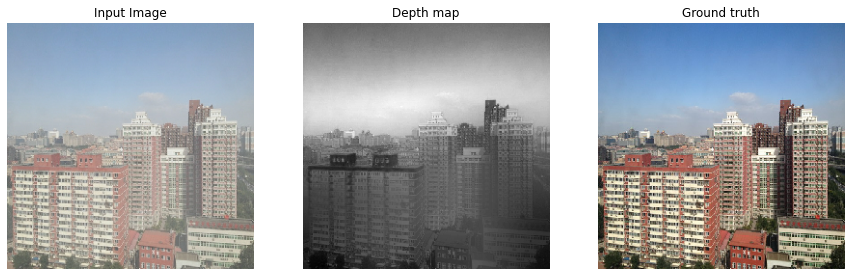

In [ ]:
for example_input, example_target in test_dataset.take(1):
    plt.figure(figsize=(15, 15))
    print(example_input[0])
    dmap = example_input[0, :, :, -1]
    img = example_input[0, :, :, :3]
    display_list = [img, dmap, example_target[0]]
    title = ['Input Image', 'Depth map', 'Ground truth']
    for i in range(3):
        plt.subplot(1, 3, i+1)
        plt.title(title[i])
        # getting the pixel values between [0, 1] to plot it.
        if i == 1:
            plt.imshow(display_list[i] * 0.5 + 0.5, cmap="gray")
        else:
            plt.imshow(display_list[i] * 0.5 + 0.5)
        plt.axis('off')
    plt.show() 

# Model Creation

In [ ]:
def downsample(filters, size, apply_batchnorm=True):
  initializer = tf.random_normal_initializer(0., 0.02)

  result = tf.keras.Sequential()
  result.add(
      tf.keras.layers.Conv2D(filters, size, strides=2, padding='same',
                             kernel_initializer=initializer, use_bias=False))

  if apply_batchnorm:
    result.add(tf.keras.layers.BatchNormalization())

  result.add(tf.keras.layers.LeakyReLU())

  return result

def upsample(filters, size, apply_dropout=False):
  initializer = tf.random_normal_initializer(0., 0.02)

  result = tf.keras.Sequential()
  result.add(
    tf.keras.layers.Conv2DTranspose(filters, size, strides=2,
                                    padding='same',
                                    kernel_initializer=initializer,
                                    use_bias=False))
  result.add(tf.keras.layers.BatchNormalization())

  if apply_dropout:
      result.add(tf.keras.layers.Dropout(0.5))

  result.add(tf.keras.layers.ReLU())

  return result

KerasTensor(type_spec=TensorSpec(shape=(None, 128, 128, 64), dtype=tf.float32, name=None), name='sequential/leaky_re_lu/LeakyRelu:0', description="created by layer 'sequential'")
KerasTensor(type_spec=TensorSpec(shape=(None, 64, 64, 128), dtype=tf.float32, name=None), name='sequential_1/leaky_re_lu_1/LeakyRelu:0', description="created by layer 'sequential_1'")


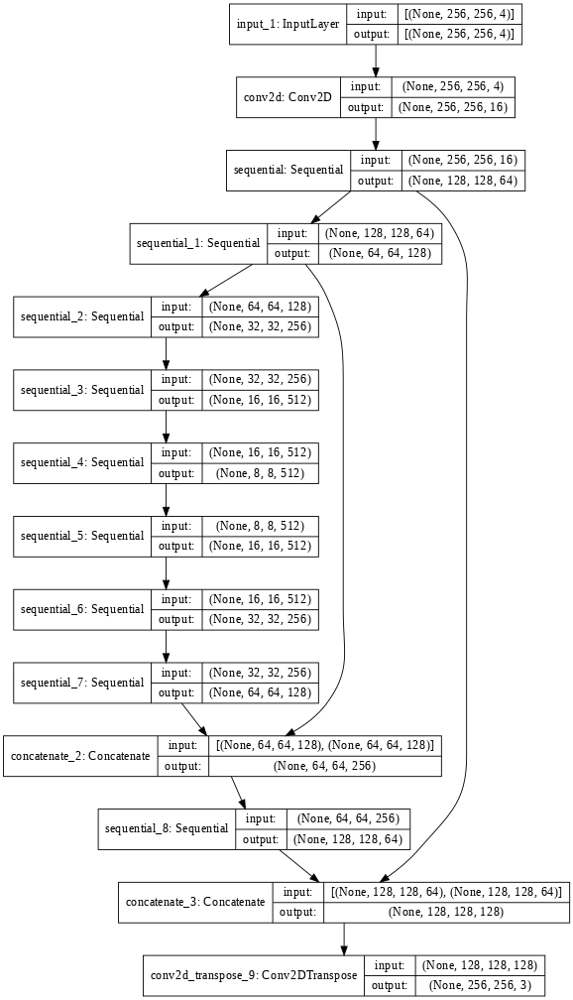

In [ ]:
def Generator():
    inputs = tf.keras.layers.Input(shape=[IMG_HEIGHT,IMG_WIDTH,4])

    initializer = tf.random_normal_initializer(0., 0.02)
    convLayer = tf.keras.layers.Conv2D(filters=16,kernel_size=1,strides=1, padding='same', kernel_initializer=initializer)

    
    x = inputs
    # Increase number of layers
    x = convLayer(x)

    down_stack = [
        downsample(64, 4, apply_batchnorm=False), # (bs, 128, 128, 64)
        downsample(128, 4), # (bs, 64, 64, 128)
        downsample(256, 4), # (bs, 32, 32, 256)
        downsample(512, 4), # (bs, 16, 16, 512)
        downsample(512, 4), # (bs, 8, 8, 512)

    ]

    fog_up_stack = [
        upsample(512, 4), # (bs, 16, 16, 1024)
        upsample(256, 4), # (bs, 32, 32, 512)
        upsample(128, 4), # (bs, 64, 64, 256)
        upsample(64, 4), # (bs, 128, 128, 128)
    ]

    rain_up_stack = [
        upsample(512, 4), # (bs, 16, 16, 1024)
        upsample(256, 4), # (bs, 32, 32, 512)
        upsample(128, 4), # (bs, 64, 64, 256)
        upsample(128, 4), # (bs, 128, 128, 128)
    ]

    last = tf.keras.layers.Conv2DTranspose(OUTPUT_CHANNELS, 4,
                                            strides=2,
                                            padding='same',
                                            kernel_initializer=initializer,
                                            activation='tanh') # (bs, 256, 256, 3)
    
    # Downsampling through the model
    fogSkips = []
    rainSkips = []

    for i, down in enumerate(down_stack):
        x = down(x)
        if i >= 0:
            if i >=2:
                rainSkips.append(x)

            if i < 2:
                print(x)
                fogSkips.append(x)

    rainSkips = reversed(rainSkips[:-1])
    fogSkips = reversed(fogSkips)

    rainConn = x
    fogConn = x

    # Upsampling and establishing the skip connections for rain block

    for up, skip in zip(rain_up_stack[:2], rainSkips):
        rainConn = up(rainConn)
        rainConn = tf.keras.layers.Concatenate()([rainConn, skip])

    for up in rain_up_stack[2:]:
        rainConn = up(rainConn)

    # Upsampling and establishing the skip connections for rain block
    for up in fog_up_stack[:2]:
        fogConn = up(fogConn)

    for up, skip in zip(fog_up_stack[2:], fogSkips):
        fogConn = up(fogConn)
        fogConn = tf.keras.layers.Concatenate()([fogConn, skip])

    combined = tf.keras.layers.Concatenate()([fogConn, rainConn])
    combined = last(combined)
    # x = last(x)

    fogConn = tf.keras.layers.Conv2DTranspose(OUTPUT_CHANNELS, 4,
                                            strides=2,
                                            padding='same',
                                            kernel_initializer=initializer,
                                            activation='tanh')(fogConn)

    rainConn = tf.keras.layers.Conv2DTranspose(OUTPUT_CHANNELS, 4,
                                            strides=2,
                                            padding='same',
                                            kernel_initializer=initializer,
                                            activation='tanh')(rainConn)

    defogger = tf.keras.Model(inputs=inputs, outputs=fogConn)
    derainer = tf.keras.Model(inputs=inputs, outputs=rainConn)
    return tf.keras.Model(inputs=inputs, outputs=combined), defogger, derainer

K.clear_session()
generator, defogger, derainer = Generator()
generator = defogger
tf.keras.utils.plot_model(generator, show_shapes=True, dpi=64)

In [ ]:
LAMBDA = 100

In [ ]:
loss_object = tf.keras.losses.BinaryCrossentropy(from_logits=True)

In [ ]:
def generator_loss(disc_generated_output, gen_output, target):
  gan_loss = loss_object(tf.ones_like(disc_generated_output), disc_generated_output)

  # mean absolute error
  l1_loss = tf.reduce_mean(tf.abs(target - gen_output))

  total_gen_loss = gan_loss + (LAMBDA * l1_loss)

  return total_gen_loss, gan_loss, l1_loss

In [ ]:
def Discriminator():
  initializer = tf.random_normal_initializer(0., 0.02)

  inp = tf.keras.layers.Input(shape=[256, 256, 3], name='input_image')
  tar = tf.keras.layers.Input(shape=[256, 256, 3], name='target_image')

  x = tf.keras.layers.concatenate([inp, tar])  # (bs, 256, 256, channels*2)

  down1 = downsample(64, 4, False)(x)  # (bs, 128, 128, 64)
  down2 = downsample(128, 4)(down1)  # (bs, 64, 64, 128)
  down3 = downsample(256, 4)(down2)  # (bs, 32, 32, 256)

  zero_pad1 = tf.keras.layers.ZeroPadding2D()(down3)  # (bs, 34, 34, 256)
  conv = tf.keras.layers.Conv2D(512, 4, strides=1,
                                kernel_initializer=initializer,
                                use_bias=False)(zero_pad1)  # (bs, 31, 31, 512)

  batchnorm1 = tf.keras.layers.BatchNormalization()(conv)

  leaky_relu = tf.keras.layers.LeakyReLU()(batchnorm1)

  zero_pad2 = tf.keras.layers.ZeroPadding2D()(leaky_relu)  # (bs, 33, 33, 512)

  last = tf.keras.layers.Conv2D(1, 4, strides=1,
                                kernel_initializer=initializer)(zero_pad2)  # (bs, 30, 30, 1)

  return tf.keras.Model(inputs=[inp, tar], outputs=last)

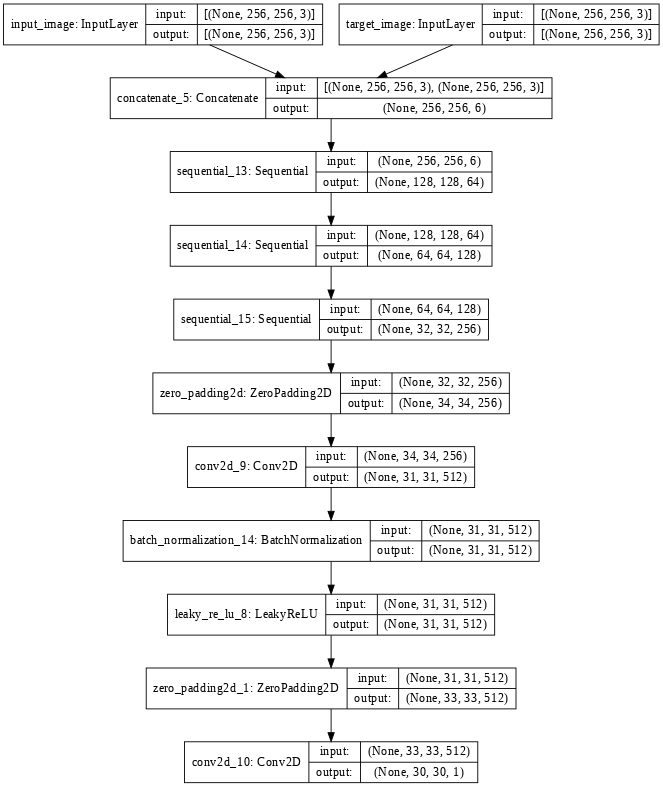

In [ ]:
discriminator = Discriminator()
tf.keras.utils.plot_model(discriminator, show_shapes=True, dpi=64)

In [ ]:
def discriminator_loss(disc_real_output, disc_generated_output):
  real_loss = loss_object(tf.ones_like(disc_real_output), disc_real_output)

  generated_loss = loss_object(tf.zeros_like(disc_generated_output), disc_generated_output)

  total_disc_loss = real_loss + generated_loss

  return total_disc_loss

In [ ]:
generator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
discriminator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

In [ ]:
checkpoint_dir = './training_checkpoints'
checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                 discriminator_optimizer=discriminator_optimizer,
                                 generator=generator,
                                 discriminator=discriminator)

PSNR: 6.466453552246094
SSIM: 0.001058839145116508


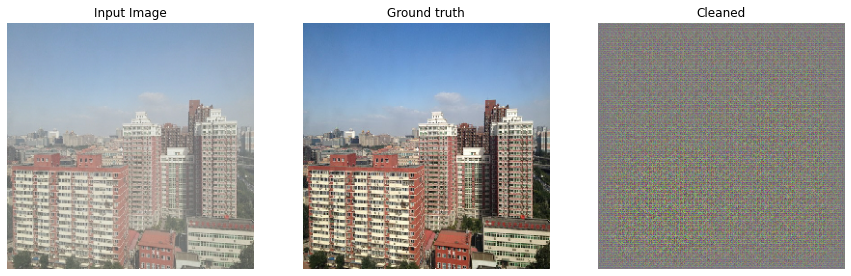

In [ ]:
def generate_images(model, test_input, tar):
    prediction = model(test_input, training=True)

    plt.figure(figsize=(15, 15))

    img = example_input[0, :, :, :3]
    display_list = [img, tar[0], prediction[0]]
    psnr = tf.image.psnr(tar[0], prediction[0], max_val = 1.0)
    ssim = tf.image.ssim(tar[0], prediction[0], max_val = 1.0)
    print(f"PSNR: {psnr.numpy()}\nSSIM: {ssim.numpy()}")
    title = ['Input Image', 'Ground truth', 'Cleaned']
    for i in range(3):
        plt.subplot(1, 3, i+1)
        plt.title(title[i])
        # getting the pixel values between [0, 1] to plot it.
        plt.imshow(display_list[i] * 0.5 + 0.5)
        plt.axis('off')
    plt.show() 

    return psnr.numpy(), ssim.numpy()

for example_input, example_target in test_dataset.take(1):
  generate_images(generator, example_input, example_target)

# Training

In [ ]:
EPOCHS = 150

In [ ]:
import datetime
log_dir="logs/"

summary_writer = tf.summary.create_file_writer(
  log_dir + "fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))

In [ ]:
@tf.function
def train_step(input_image, target, epoch):
  with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
    gen_output = generator(input_image, training=True)

    disc_real_output = discriminator([input_image[...,:3], target], training=True)
    disc_generated_output = discriminator([input_image[...,:3], gen_output], training=True)

    gen_total_loss, gen_gan_loss, gen_l1_loss = generator_loss(disc_generated_output, gen_output, target)
    disc_loss = discriminator_loss(disc_real_output, disc_generated_output)

  generator_gradients = gen_tape.gradient(gen_total_loss,
                                          generator.trainable_variables)
  discriminator_gradients = disc_tape.gradient(disc_loss,
                                               discriminator.trainable_variables)

  generator_optimizer.apply_gradients(zip(generator_gradients,
                                          generator.trainable_variables))
  discriminator_optimizer.apply_gradients(zip(discriminator_gradients,
                                              discriminator.trainable_variables))

  with summary_writer.as_default():
    tf.summary.scalar('gen_total_loss', gen_total_loss, step=epoch)
    tf.summary.scalar('gen_gan_loss', gen_gan_loss, step=epoch)
    tf.summary.scalar('gen_l1_loss', gen_l1_loss, step=epoch)
    tf.summary.scalar('disc_loss', disc_loss, step=epoch)

In [ ]:
def fit(train_ds, epochs, test_ds):
  for epoch in range(epochs):
    start = time.time()

    display.clear_output(wait=True)

    for example_input, example_target in test_ds.take(1):
      generate_images(generator, example_input, example_target)
    print("Epoch: ", epoch)

    # Train
    for n, (input_image, target) in train_ds.enumerate():
      print('.', end='')
      if (n+1) % 100 == 0:
        print()
      train_step(input_image, target, epoch)
    print()

    # saving (checkpoint) the model every 20 epochs
    if (epoch + 1) % 20 == 0:
      checkpoint.save(file_prefix=checkpoint_prefix)

    print ('Time taken for epoch {} is {} sec\n'.format(epoch + 1,
                                                        time.time()-start))
  checkpoint.save(file_prefix=checkpoint_prefix)

PSNR: 17.907581329345703
SSIM: 0.6684128642082214


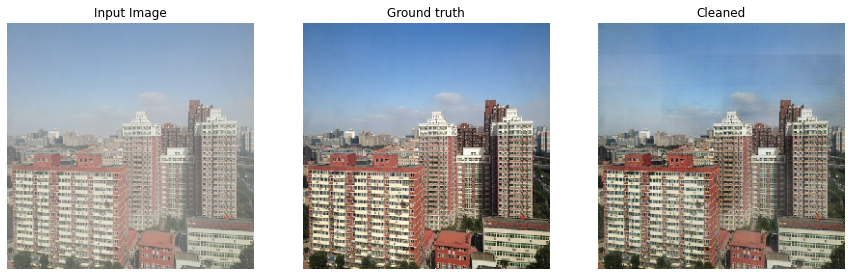

Epoch:  149
..............................
Time taken for epoch 150 is 15.422587871551514 sec



In [ ]:
fit(train_dataset, EPOCHS, test_dataset)

In [ ]:
discriminator.save("/content/drive/MyDrive/2-2/SOP/De-fogger/disc-reside-t3")

INFO:tensorflow:Assets written to: /content/drive/MyDrive/2-2/SOP/De-fogger/disc-reside-t3/assets


In [ ]:
generator.save("/content/drive/MyDrive/2-2/SOP/De-fogger/reside-t3")

INFO:tensorflow:Assets written to: /content/drive/MyDrive/2-2/SOP/De-fogger/reside-t3/assets


PSNR: 26.873289108276367
SSIM: 0.9347929954528809


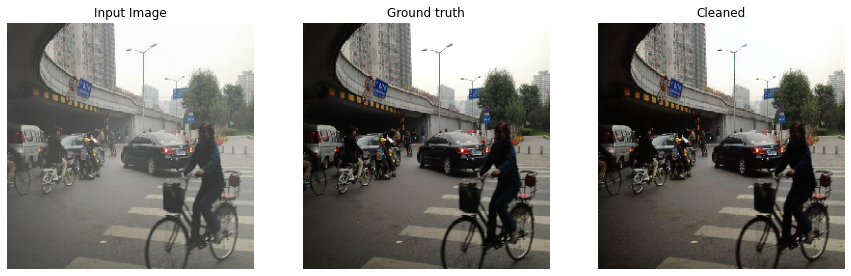

Inference time: 0.36039233207702637
PSNR: 24.847850799560547
SSIM: 0.894470751285553


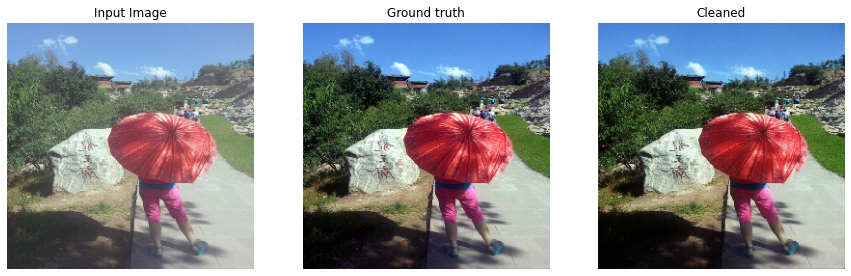

Inference time: 0.3652610778808594
PSNR: 23.909618377685547
SSIM: 0.8887636661529541


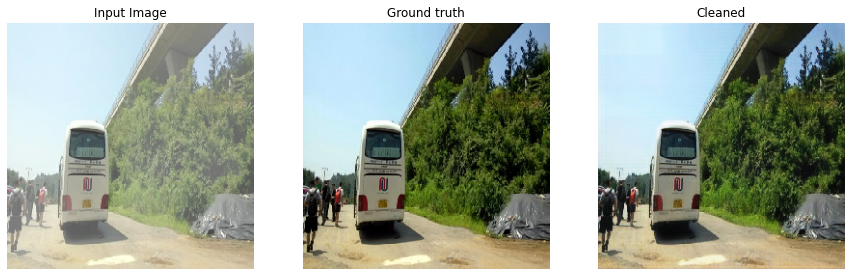

Inference time: 0.382601261138916
PSNR: 25.78175926208496
SSIM: 0.8617185950279236


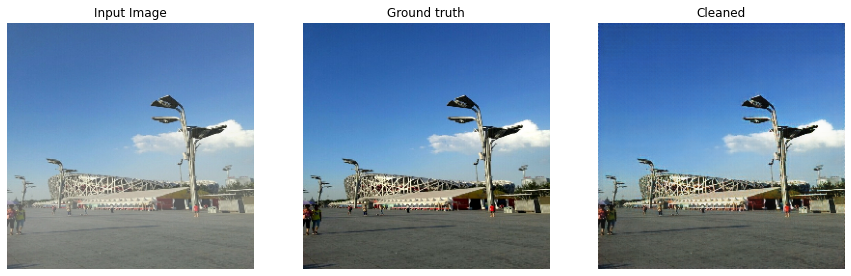

Inference time: 0.3874044418334961
PSNR: 27.169002532958984
SSIM: 0.9163677096366882


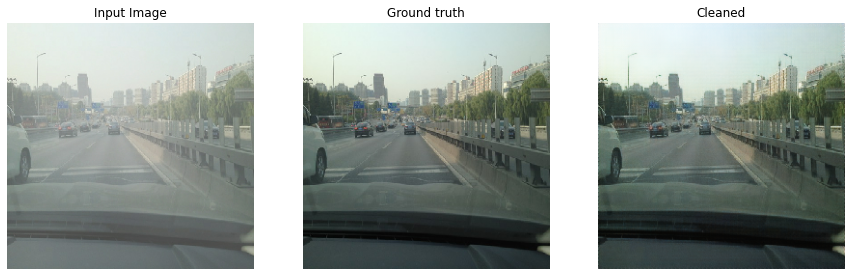

Inference time: 0.3624439239501953
PSNR: 30.170766830444336
SSIM: 0.909731924533844


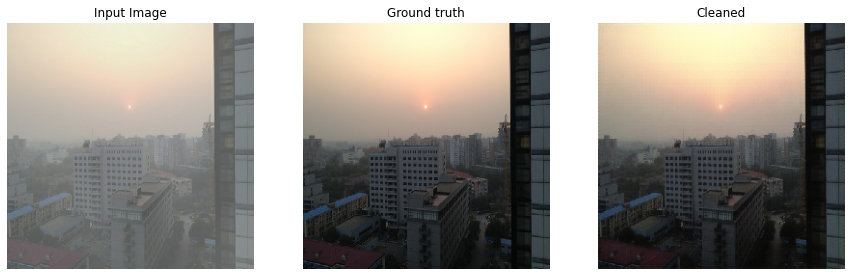

Inference time: 0.37879371643066406
PSNR: 23.587745666503906
SSIM: 0.8677818775177002


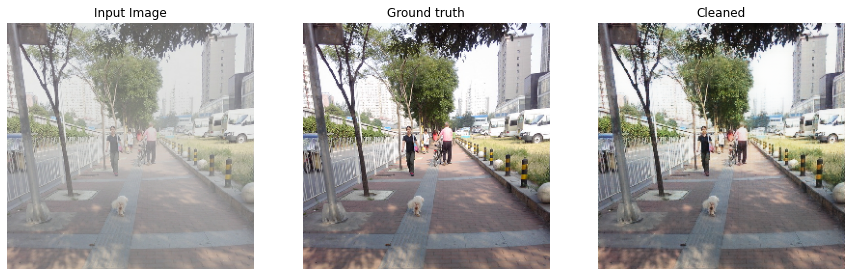

Inference time: 0.3704390525817871
PSNR: 26.381799697875977
SSIM: 0.9193107485771179


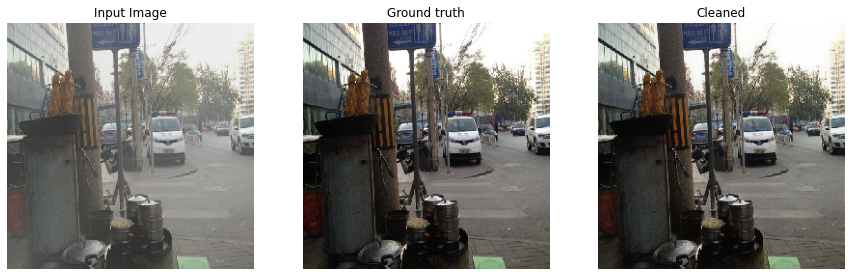

Inference time: 0.38719797134399414
PSNR: 23.872652053833008
SSIM: 0.911472737789154


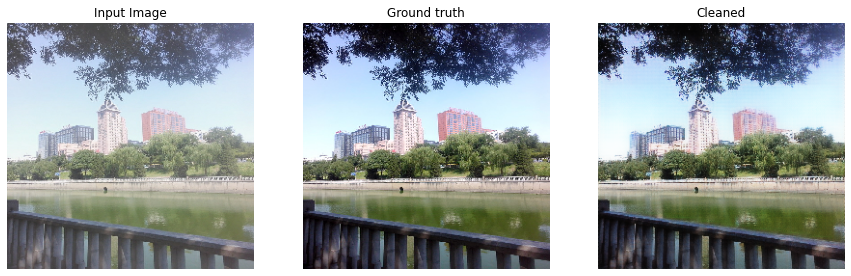

Inference time: 0.46281981468200684
PSNR: 26.94264030456543
SSIM: 0.9021989703178406


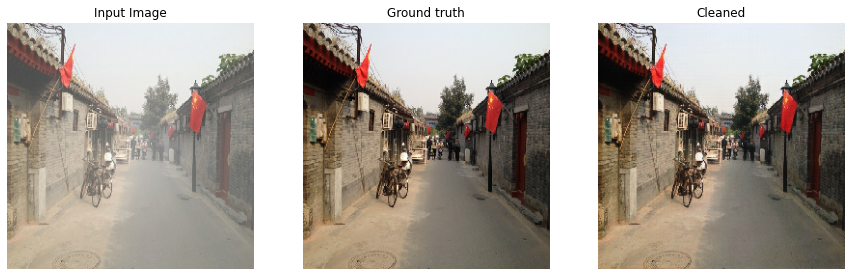

Inference time: 0.40031862258911133
PSNR: 26.48200798034668
SSIM: 0.8780441880226135


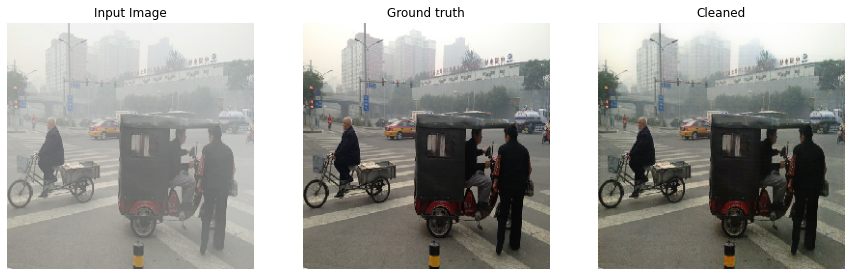

Inference time: 0.386120080947876
PSNR: 23.25994873046875
SSIM: 0.9002718329429626


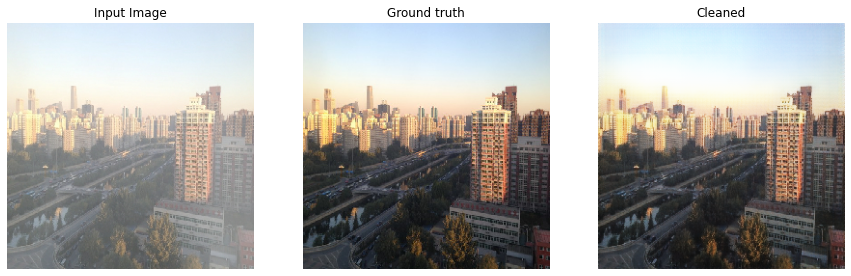

Inference time: 0.3855767250061035
PSNR: 23.437854766845703
SSIM: 0.8895015716552734


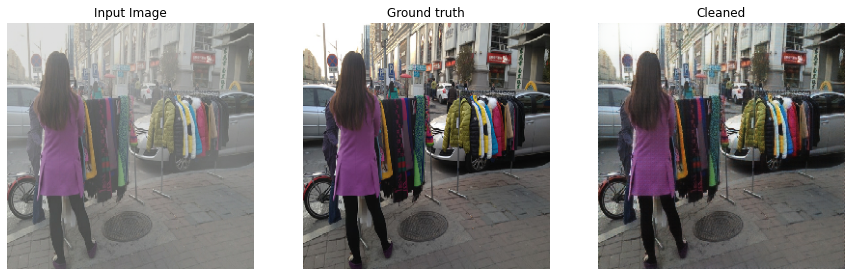

Inference time: 0.3952469825744629
PSNR: 28.87596321105957
SSIM: 0.9493867754936218


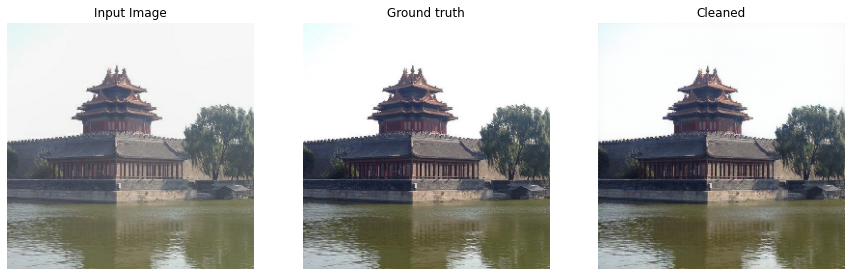

Inference time: 0.366546630859375
PSNR: 25.25146484375
SSIM: 0.9012120366096497


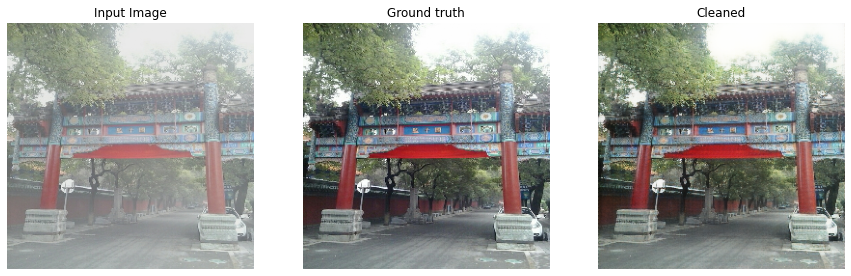

Inference time: 0.3990974426269531
PSNR: 29.708229064941406
SSIM: 0.9095924496650696


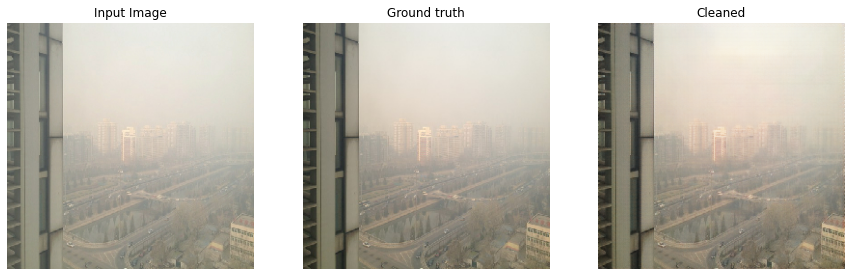

Inference time: 0.419374942779541
PSNR: 27.16228675842285
SSIM: 0.9001902937889099


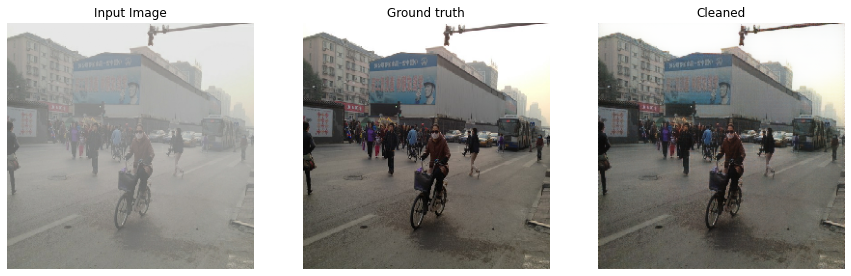

Inference time: 0.5500485897064209
PSNR: 25.409698486328125
SSIM: 0.8950149416923523


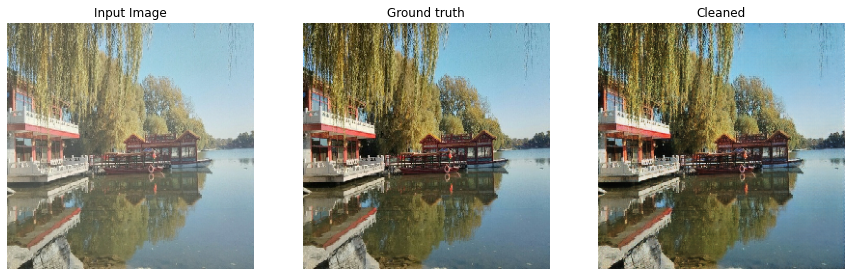

Inference time: 0.424105167388916
PSNR: 28.025005340576172
SSIM: 0.9378698468208313


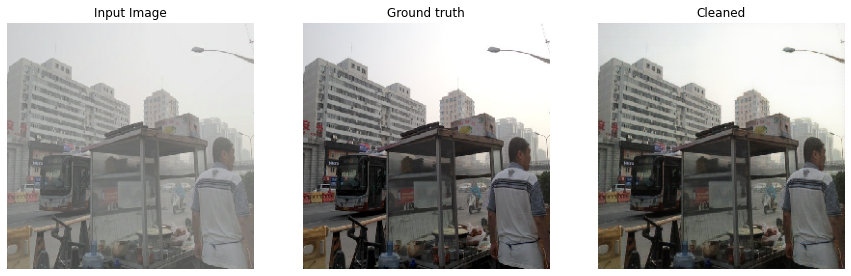

Inference time: 0.4166605472564697
PSNR: 27.176456451416016
SSIM: 0.9113556742668152


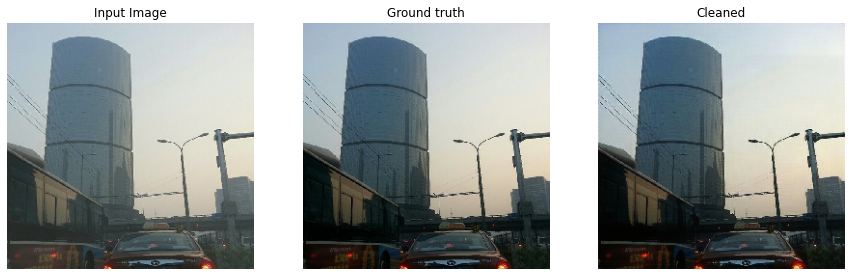

Inference time: 0.4353659152984619
PSNR: 24.382198333740234
SSIM: 0.864692747592926


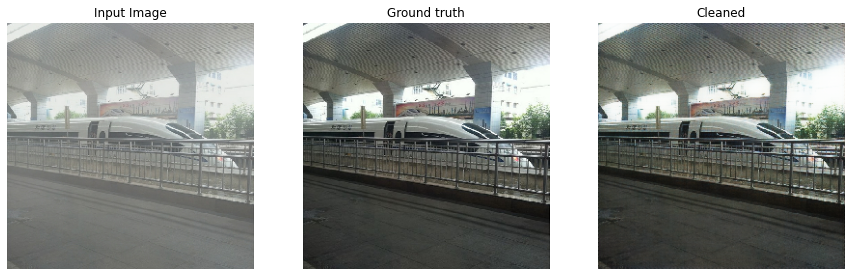

Inference time: 0.4191243648529053
PSNR: 28.254161834716797
SSIM: 0.9214985370635986


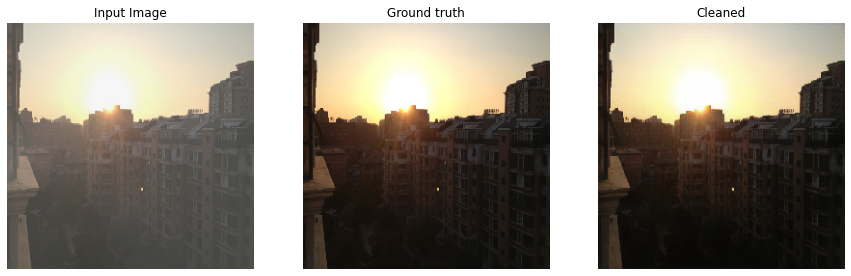

Inference time: 0.42217516899108887
PSNR: 25.37395477294922
SSIM: 0.8698814511299133


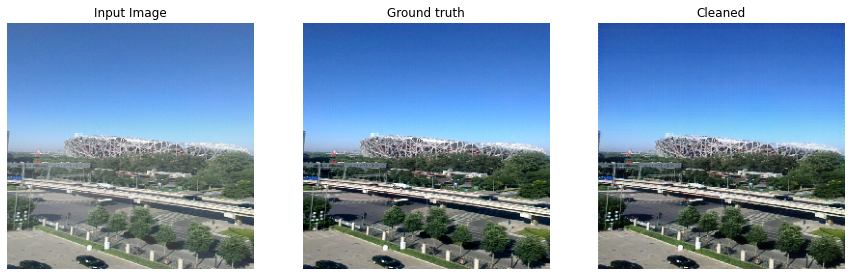

Inference time: 0.4240734577178955
PSNR: 27.92286491394043
SSIM: 0.9340071678161621


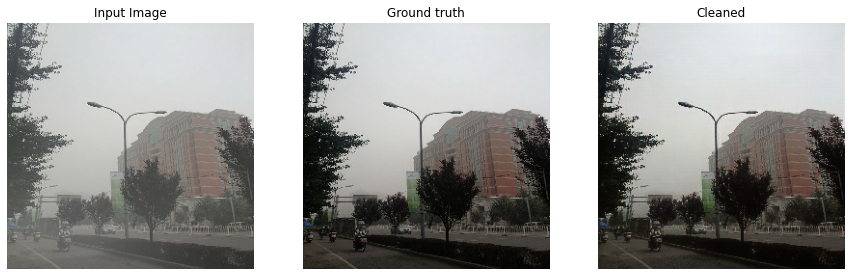

Inference time: 0.41848278045654297
PSNR: 28.36779022216797
SSIM: 0.9295897483825684


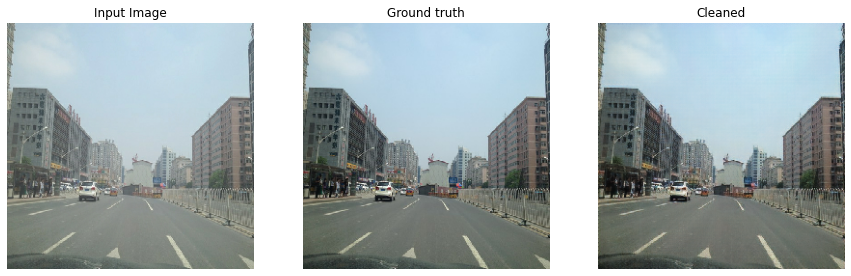

Inference time: 0.4710354804992676
PSNR: 24.7303466796875
SSIM: 0.88234943151474


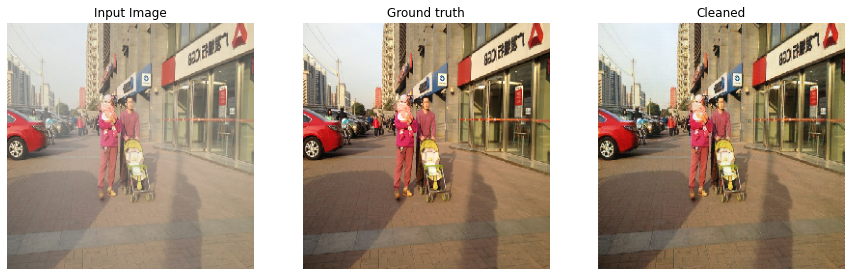

Inference time: 0.4754359722137451
PSNR: 26.29098129272461
SSIM: 0.8931501507759094


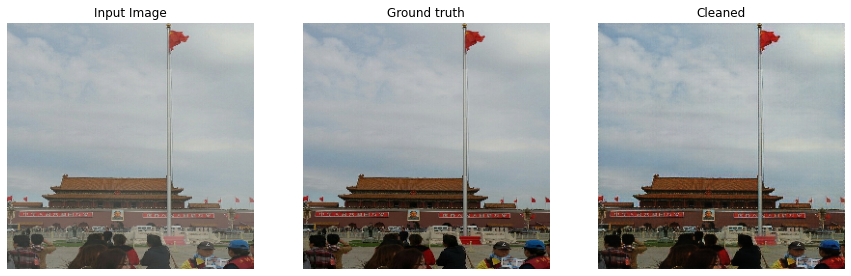

Inference time: 0.4375491142272949
PSNR: 29.17220115661621
SSIM: 0.9198570251464844


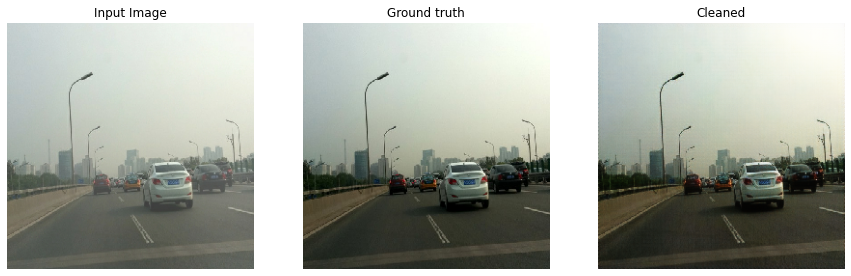

Inference time: 0.5766372680664062
PSNR: 24.65224266052246
SSIM: 0.9226556420326233


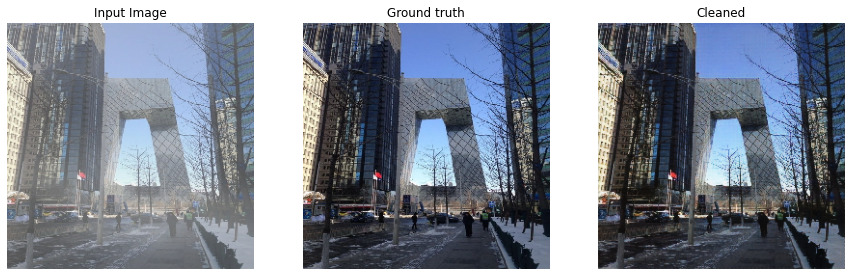

Inference time: 0.42827486991882324
PSNR: 25.77714729309082
SSIM: 0.9146563410758972


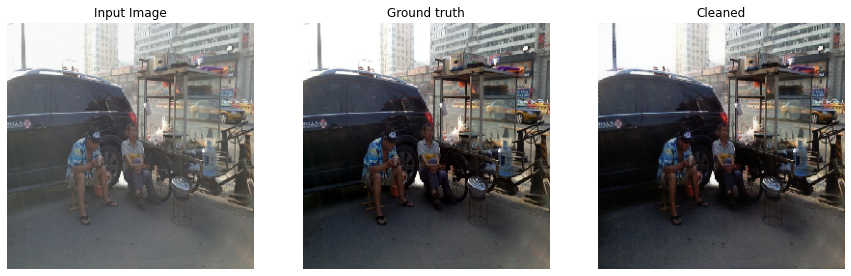

Inference time: 0.41916728019714355


In [ ]:
p = []
s = []

for i, (example_input, example_target) in enumerate(train_dataset):
    start = time.time()
    psnr, ssim = generate_images(generator, example_input, example_target)
    p.append(psnr)
    s.append(ssim)
    end = time.time()
    print(f"Inference time: {end - start}")


In [ ]:
def Average(lst):
    return sum(lst) / len(lst)

print(f"PSNR: {Average(p)}\nSSIM: {Average(s)}")

PSNR: 26.308330980936685
SSIM: 0.9043795943260193
